# PlotBXA example 

written by David Homan.

## Basic BXA usage with Xspec & additional plotting

This notebook aims to illustrate additional plotting features for BXA fitting results, as implemented in the PlotBXA class. The methods of this class will be demonstrated in a basic example of BXA fitting. For details on BXA usage and the underlying fitting algorithm please see refer to Johannes Buchner's detailed [BXA documentation](https://johannesbuchner.github.io/BXA/index.html) and [UltraNest documentation](https://johannesbuchner.github.io/UltraNest/readme.html), which also contain several useful examples. 

An overview of tutorials on BXA usage can be found [here](https://johannesbuchner.github.io/BXA/tutorials.html). The methods in PlotBXA are extensions of the built-in methods of UltraNest and BXA. Furthermore, they are strongly based on the [excellent tutorial](https://peterboorman.com/tutorial_bxa) by Peter Boorman. As for the classes defined in PlotXspec, some users may find it more helpful to use these methods as a template for their own plotting.

_Please note_: this notebook relates to BXA, for examples of PyXspec and the PlotXspec class, please see the notebook [_tutorial_usage_plotxspec_](https://johannesbuchner.github.io/BXA/tutorial_usage_plotxspec.html). The notebooks both fit the same datasets, but with different methodologies.


#### This notebook is structured as follows
1) Single spectrum & single model
2) Single spectrum & multiple models: model comparison
    - Example running multiple processes
3) Multiple spectra
4) Additional plotting examples

---
This notebook was tested with:
- HEASOFT 6.33.1
- Python 3.11.4
- BXA 4.1.1
- UltraNest 3.6.1

In [1]:
# load the required modules
import xspec
import bxa.xspec as bxa
from bxa.xspec.solver import XSilence  #<= very useful in suppressing unneeded XSpec output
import ultranest.plot as upl

import os,sys

# Create an instance of the PlotBXA class
sys.path.append(os.getcwd()+'/..')
from bxa.xspec.workflow.plot_bxa import PlotBXA
pbx = PlotBXA() # NOTE: all PlotXspec methods are also accessible through PlotBXA

In [2]:
# initial setup for XSpec
xspec.Fit.statMethod = "cstat" #<= BXA is designed to work in the low-count regime and requires Xspec to use C-statistics
xspec.Xset.abund = 'wilm' # Wilms et al. '00'
xspec.Xset.xsect = 'vern' # Verner et al. '96'
xspec.Xset.cosmo = '70 0 0.73'

Default fit statistic is set to: C-Statistic
   This will apply to all current and newly loaded spectra.
 Solar Abundance Vector set to wilm:  Wilms, J., Allen, A. & McCray, R. ApJ 542 914 (2000) (abundances are set to zero for those elements not included in the paper).
 Cross Section Table set to vern:  Verner, Ferland, Korista, and Yakovlev 1996


In [3]:
# store the path of the main directory
maindir = os.getcwd()

## 1) Single spectrum & single model

The simplest example is to load a single spectrum into XSpec and fit it with a model using BXA. This example will allow us to demonstrate most of PlotBXA's functionality. As an example, we will use simulated Athena data.

In [4]:
# load data
#
# In the following we will change the working directory to example_data/xmm/ as it is
# easier to work in the directory where the spectra are stored, particularly when (re-)loading
# files into XSpec

with XSilence():
    # Load the data
    xspec.AllData.clear()
    xspec.AllModels.clear()
    
    # Move to the working directory
    if 'athena' not in os.getcwd():
        os.chdir(os.path.join(maindir,'example_data/athena/'))

    epicfn = 'example-file.fak'
    xspec.AllData(f"{epicfn}")

    # Spectral range
    xspec.AllData.notice('all')
    xspec.AllData.ignore('bad')
    xspec.AllData(1).ignore('**-1.0 10.0-**')
    
xspec.AllData.show()


1 file 1 spectrum 
Spectrum 1  Spectral Data File: example-file.fak
Net count rate (cts/s) for Spectrum:1  4.122e+00 +/- 9.080e-02
 Assigned to Data Group 1 and Plot Group 1
  Noticed Channels:  94-1016
  Telescope: ATHENA+ Instrument: WFI  Channel Type: PI
  Exposure Time: 500 sec
 Using fit statistic: cstat
 Using Response (RMF) File            athenapp_ir_b4c_wfi_withfilter_fov40.0arcmin_avg.rsp for Source 1



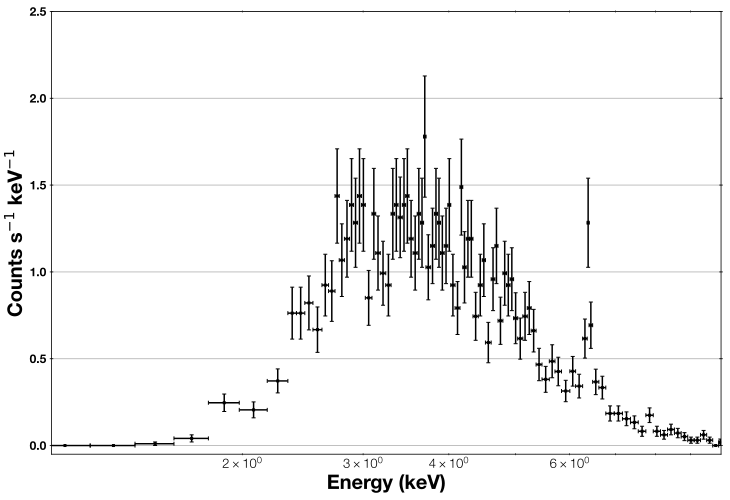

In [5]:
# Quick first look at the spectrum (all the methods from PyXspec can
# still be accessed from PlotBXA instances)
pbx.first_look(ymin=-0.05,ymax=2.5,ylog=False,
               rebinsig=5,rebinbnum=20)

In [6]:
# Define a model to fit the data
with XSilence():
    xspec.AllModels += ("wabs*powerlaw")
    mod = xspec.AllModels(1)

    mod.wabs.nH.values  = (1., 0.01, 1e-3, 1e-3, 50., 50.)

    mod.powerlaw.PhoIndex.values = (1.7, 0.1, 0., 0., 3., 3.)
    mod.powerlaw.norm.values = (1.e-1, 0.01, 1.e-3, 1.e-3, 5e-1, 5e-1)
    
xspec.AllModels.show()


Parameters defined:
Model wabs<1>*powerlaw<2> Source No.: 1   Active/On
Model Model Component  Parameter  Unit     Value
 par  comp
   1    1   wabs       nH         10^22    1.00000      +/-  0.0          
   2    2   powerlaw   PhoIndex            1.70000      +/-  0.0          
   3    2   powerlaw   norm                0.100000     +/-  0.0          
________________________________________________________________________



In [7]:
# Define the priors for the variable parameters
#
# We pass every parameter by name to a single prior function.
# For the parameter ranges below, we define log-uniform priors,
# to more efficiently traverse the parameter space
p1 = bxa.create_uniform_prior_for(mod, mod.wabs.nH)
p2 = bxa.create_uniform_prior_for(mod, mod.powerlaw.PhoIndex)
p3 = bxa.create_loguniform_prior_for(mod, mod.powerlaw.norm)

# Create a BXA solver using the priors
solver = bxa.BXASolver(transformations=[p1,p2,p3],
                       outputfiles_basename="wabs_pl") #<= this will be the name of the directory where all
                                                       #   BXA output is stored (this name must be unique)

  uniform prior for nH between 0.001000 and 50.000000 
   note: this parameter spans several dex. Should it be log-uniform (create_jeffreys_prior_for)?
  uniform prior for PhoIndex between 0.000000 and 3.000000 
  jeffreys prior for norm between 1.000000e-03 and 5.000000e-01 


### Prior predictive checks

Before we continue to the fit, it is good to check the priors are suitable. Do the parameter ranges provide sufficient space for the model to match the data?

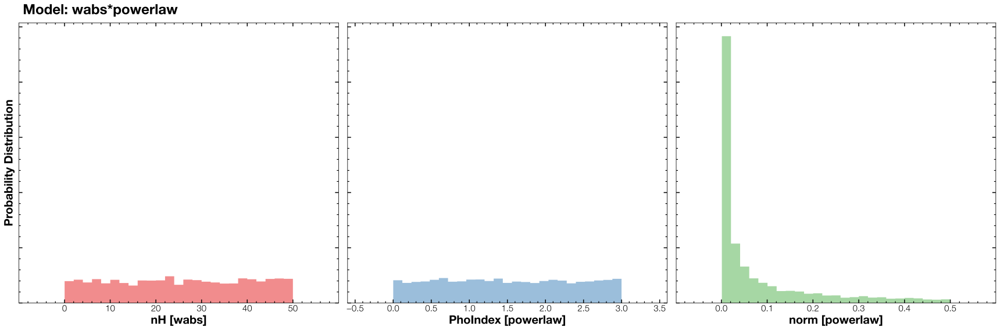

In [8]:
# Let's have a look at the distribution of the parameters in linear space. What do the log-uniform
# priors look like? Do they cover the specified range?
with XSilence():
    pbx.plot_overview_priors(solver,
                             nsample=5000,nbins=25,
                             convert_log=True)

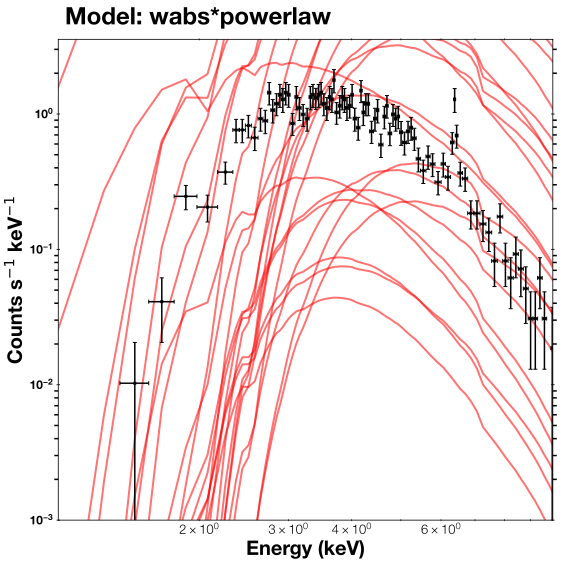

In [9]:
# What are the spectral shapes that can be covered based on our specified priors?
#
# The range of the potential models (plotted in red) should cover the shape of the spectrum;
# based on these results we can adjust the priors as necessary. If the data are not well
# matched, we either need a better model, or broader priors. If the range covers the data,
# but is also very wide, we could reduce the width of (some of) the priors, to reduce the
# calculation time when fitting.

with XSilence():
    pbx.plot_model_instances(solver,
                             nsample=25, #<= This sets the number of instances of the model we want to plot
                             ymin=1e-3,
                             rebinsig=5,
                             rebinbnum=20)

### Run the fit

In [10]:
with XSilence():
     results = solver.run(resume=True) #<= Setting resume to True will allow the solver to resume operation
                                       #   from a previously saved run. This can save a lot of time.

[ultranest] Resuming from 6268 stored points


[ultranest] Explored until L=-5e+02  


[ultranest] Likelihood function evaluations: 10273


[ultranest] Writing samples and results to disk ...


[ultranest] Writing samples and results to disk ... done


[ultranest]   logZ = -475 +- 0.1436


[ultranest] Effective samples strategy satisfied (ESS = 1842.6, need >400)


[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)


[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)


[ultranest]   logZ error budget: single: 0.15 bs:0.14 tail:0.02 total:0.15 required:<0.50


[ultranest] done iterating.



logZ = -474.984 +- 0.338
  single instance: logZ = -474.984 +- 0.155
  bootstrapped   : logZ = -474.965 +- 0.337
  tail           : logZ = +- 0.025
insert order U test : converged: True correlation: inf iterations

    nH                  : 7.55  │ ▁ ▁▁▁▁▁▁▁▂▃▃▄▅▅▆▇▇▇▆▅▄▄▃▂▂▁▁▁▁▁▁▁▁  ▁ │11.60     9.46 +- 0.46
    PhoIndex            : 1.17  │ ▁▁▁▁▁▁▁▁▁▂▂▃▄▄▅▅▆▆▇▇▇▅▅▃▃▃▂▂▁▁▁▁▁▁  ▁ │2.14      1.65 +- 0.12
    log(norm)           : -2.541│ ▁▁▁▁▁▁▁▁▁▂▂▂▃▃▄▅▆▆▇▇▆▅▅▄▃▃▂▂▁▁▁▁▁▁▁▁▁ │-1.811    -2.170 +- 0.092



### Evaluate the posteriors

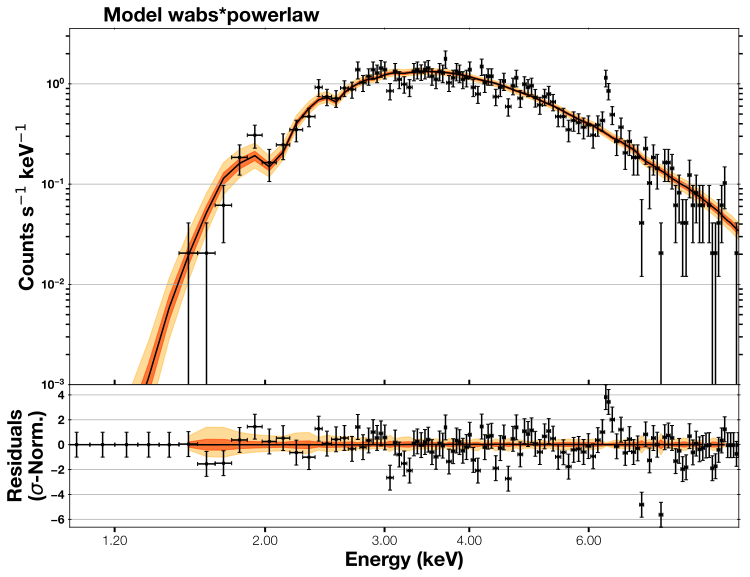

In [11]:
# Let us look at the result of the fit. We can plot the data, best fit, and a prediction-band showing the
# posterior of the fit
with XSilence():
    pbx.plot_data_and_predictionbands(solver,
                                      setxminorticks=[1.2,2,3,4,6],
                                      quantile=0.495, #<= 99% quantile in orange band (1-sigma in light red)
                                      ymin=1e-3,
                                      rebinsig=5,
                                      rebinbnum=10)

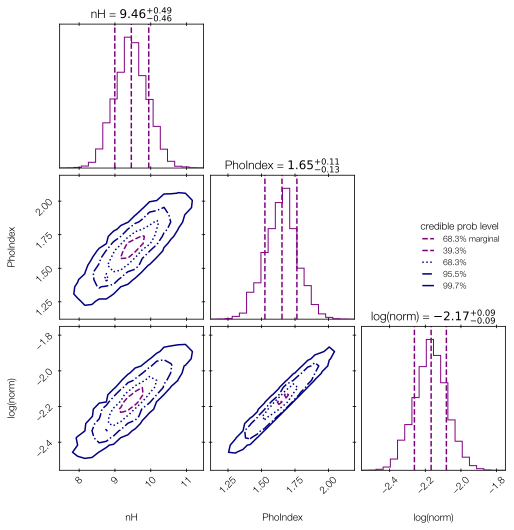

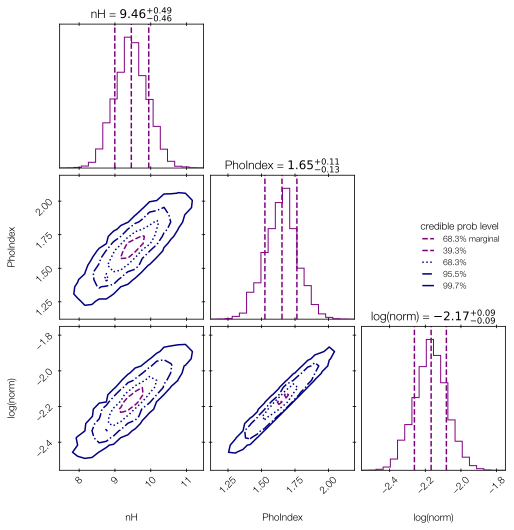

In [12]:
# What are the posterior distributions of the individual parameters?
upl.cornerplot(results)

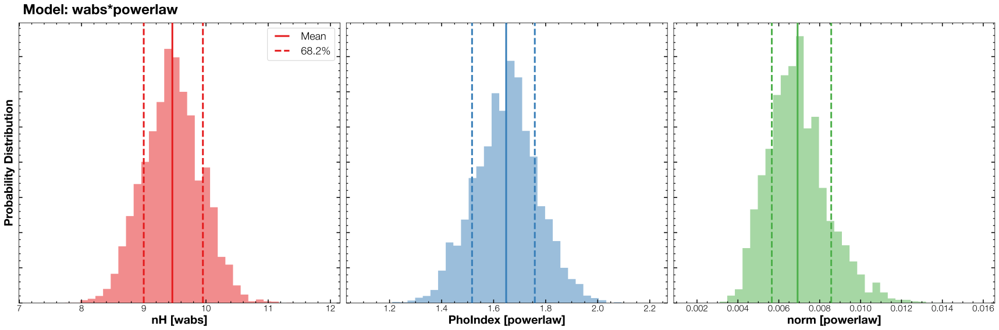

In [13]:
pbx.plot_overview_posteriors(solver,convert_log=True)

For model wabs*powerlaw:
Mean=5.133 (+)5.261 (-)5.017 (10^-12 erg cm^-2 s^-1)
With uncertainties estimated for +/- 34.1%



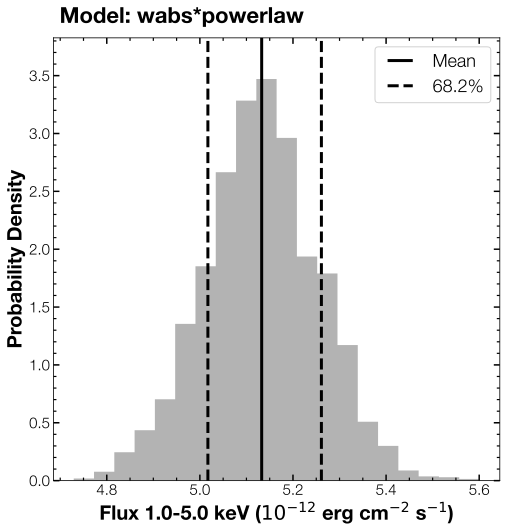

In [14]:
# And what is the posterior distribution of the flux?
with XSilence():
    pbx.plot_posterior_flux(solver,fluxrange=(1.0,5.0),printq=True)

For the methods displaying the posterior distributions (plot_overview_posteriors and plot_posterior_flux), it is possible to specify the displayed uncertainty using the 'quantile' keyword argument. For example, setting quantile=0.45 will show the 90% uncertainty margins; default is quantile=0.341, 1$\sigma$ uncertainties.

The values of the mean and the selected uncertainty can be printed or returned, by setting the keyword arguments printq and return_val to True, respectively.

###  Quantile-Quantile Plots

A helpful way of evaluating the quality of a fit is a quantile-quantile plot, which compares the cumulative distribution functions of the data and the model. The method ```plot_qq``` is in addition to the built-in ```bxa.xspec.qq``` method. ```plot_qq_difference``` presents the difference of the normalised cumulative distribution functions (data - model) plotted against energy; this can be of use in identifying where model and data diverge. 

When plotting the difference QQ plot, it is also posisble to include simulated data. The grey shade in the plot below indicates the intrinsic scatter in the data: assuming that the best-fit model is the 'real' representation of the data, we simulate a sample of spectra within the uncertainties of the data and calculate the normalised difference in the cumulative distributions. If the range in model uncertainties (in yellow/orange) lies within the range set by the uncertainties of the data (in grey), this is an indication the model suits the data well. The grey band represents 1$\sigma$ in the distribution of the simulated spectra.

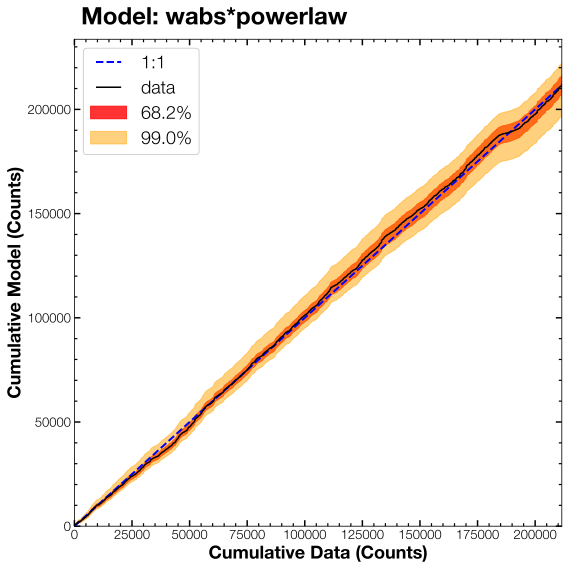

In [15]:
with XSilence():
    pbx.plot_qq(solver,
                quantile=0.495) #<= include a shaded band showing 99% of the posterior distributions

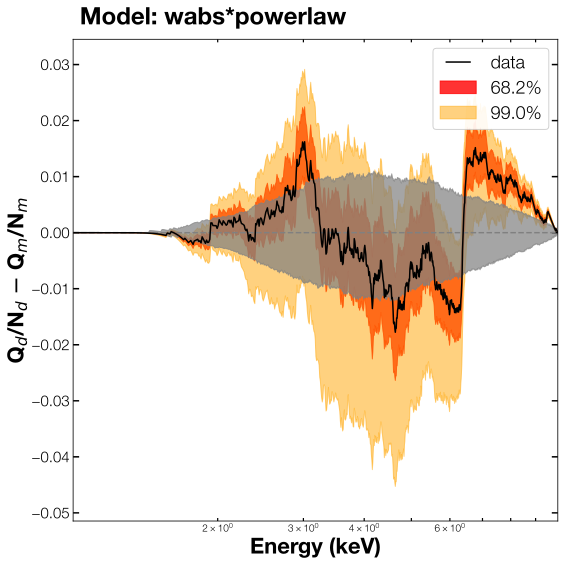

In [16]:
with XSilence():
    pbx.plot_qq_difference(solver,
                           sim_data=True,nsample=500, #<= include simulated results, based on spectra created with
                           quantile=0.495)            #   XSpec's fakeit. This shows the expected distribution _if_
                                                      #   the current model were a perfect representation of the data

### Posterior predictive checks

We can also use simulated spectra to evaluate the likelihood of our fit. We again similulate a number of spectra (set with the nsample keyword argument), based on the assumption that the best-fit model represents the 'real' data. For each of the simulated spectra we calculate the likelihood of the best-fit model (which remains fixed; this is the model as it was fit to the _real_ data). This gives an estimate of how well our fit approached the distribution underlying the data. If the likelihood of the best-fit model for the real data aligns with the centre of the distribution of likelihoods for the simulated spectra, the model represents a reasonable fit wihtin the uncertainties of the spectrum.

The fit statistic used is -log(L), where L is the Poissonian likelihood (see [here](https://heasarc.gsfc.nasa.gov/xanadu/xspec/manual/XSappendixStatistics.html) for more details on the use of C-statistics in XSpec).

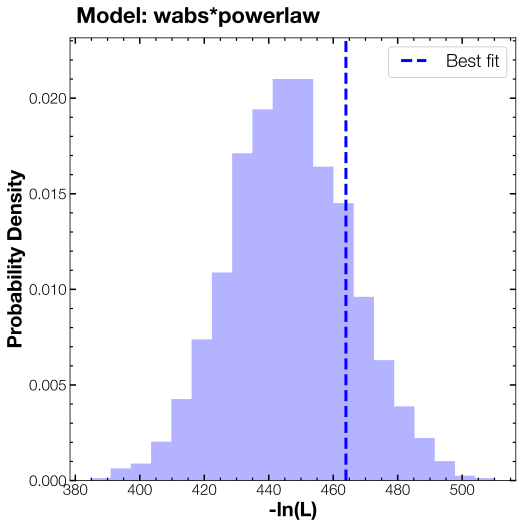

In [17]:
with XSilence():
    pbx.plot_posterior_mc_likelihood(solver,nsample=2500,colors='b')

## 2) Using multiple models

One of the strengths of Bayesian analysis is that it provides a statistical method for comparing the relative strengths of models, based on the Bayesian 'evidence' (the likelihood marginalised over the free parameters). Fitting multiple models to the data and comparing the results provides a useful way of analysing a dataset. PlotBXA's methods are set up with this use in mind.

We will make use of the same data as in Section 1), a single simulated Athena spectrum of an obscured AGN. As we saw in the results of our simple fit in the previous section, there are considerable residuals in this first fit. We will therefore test several models and compare the results using a Bayesian framework. We can use the visualisations of the fits, QQ plots, and the posterior predictive checks to visualise the relative quality of the fits, including comparisons with simulated data. A section below provides some more detail on Bayesian evidence.

We will define three models to compare: the absportpion + PL models from Section 1, an alternative model where the X-ray flux is generated by a blackbody, and a model that includes an Fe K$\alpha$ line. Of these, we expect the latter of the three to provide the best fit, as this is the model that was used to generate the data. 

#### Note on PlotBXA usage

As will become clear in the example below, there is a slight change in the way we define models when using PlotBXA in the context of multiple possible models (this is because it is impossible to activate/deactivate an XSpec model directly using PyXSpec). To allow us to switch quickly between different models, we therefore define models within Python functions, which can be quickly called whenever needed and can be passed to PlotBXA's methods.

In [18]:
# Load the data
with XSilence():
    xspec.AllData.clear()
    xspec.AllModels.clear()

    olddir = os.getcwd()
    if 'athena' not in os.getcwd():
        os.chdir(os.path.join(maindir,'example_data/athena/'))

    epicfn = 'example-file.fak'
    xspec.AllData(f"{epicfn}")

    # Spectral range
    xspec.AllData.notice('all')
    xspec.AllData.ignore('bad')
    xspec.AllData(1).ignore('**-1.0 10.0-**')
    
xspec.AllData.show()


1 file 1 spectrum 
Spectrum 1  Spectral Data File: example-file.fak
Net count rate (cts/s) for Spectrum:1  4.122e+00 +/- 9.080e-02
 Assigned to Data Group 1 and Plot Group 1
  Noticed Channels:  94-1016
  Telescope: ATHENA+ Instrument: WFI  Channel Type: PI
  Exposure Time: 500 sec
 Using fit statistic: cstat
 Using Response (RMF) File            athenapp_ir_b4c_wfi_withfilter_fov40.0arcmin_avg.rsp for Source 1



In [19]:
# Define the models; these will now be embedded in Python functions. 
# PLEASE NOTE: for the PlotBXA methods to work correctly, the functions
# must always return an XSpec model instance and the name of the model.
# These are necessary to correctly access the model in XSpec and 
# (re-)activate it whenever required

def activate_mod1():
    # This is the model we used in Section 1)
    model_name = 'mod1'
    xspec.AllModels += ("wabs*powerlaw",model_name)
    mod = xspec.AllModels(1,model_name)

    mod.wabs.nH.values  = (1., 0.01, 1e-3, 1e-3, 50., 50.)

    mod.powerlaw.PhoIndex.values = (1.7, 0.1, 0., 0., 3., 3.)
    mod.powerlaw.norm.values = (1.e-1, 0.01, 1.e-3, 1.e-3, 5e-1, 5e-1)
    
    return mod,model_name

def activate_mod2():
    # black-body instead of power-law
    model_name = 'mod2'
    xspec.AllModels += ("wabs*bbody",model_name)
    mod = xspec.AllModels(1,model_name)

    mod.wabs.nH.values  = (1., 0.01, 1e-3, 1e-3, 50., 50.)
    
    mod.bbody.kT.values = (20, 0.01, 1e-1,  1e-1, 200., 200.)
    mod.bbody.norm.values = (1e-3, 0.01, 1e-6,  1e-6, 1e-1, 1e-1)
    
    return mod, model_name

def activate_mod3():
    # same as mod1, but with added FeK
    model_name = 'mod3'
    xspec.AllModels += ("wabs*powerlaw + gauss",model_name)
    mod = xspec.AllModels(1,model_name)

    mod.wabs.nH.values  = (1., 0.01, 1e-3, 1e-3, 50., 50.)

    mod.powerlaw.PhoIndex.values = (1.7, 0.1, 0., 0., 3., 3.)
    mod.powerlaw.norm.values = (1.e-1, 0.01, 1.e-3, 1.e-3, 5e-1, 5e-1)
    
    mod.gaussian.LineE.values = (6.4, -1)  #<= Fix as K-alpha
    mod.gaussian.Sigma.values = (0.1, 0.01, 0.01, 0.01, 2., 2.)
    mod.gaussian.norm.values  = (1e-4, 0.01, 1e-6, 1e-6, 1e-1, 1e-1)
    
    return mod, model_name


In [20]:
# Let us load the models in XSpec. As you will see from the XSpec output, only one
# of the models will be active at any given time
with XSilence():
    mod1,_ = activate_mod1()
    mod2,_ = activate_mod2()
    mod3,_ = activate_mod3()
    
xspec.AllModels.show()


Parameters defined:
Model mod1:wabs<1>*powerlaw<2> Source No.: 1   Inactive/Off
Model Model Component  Parameter  Unit     Value
 par  comp
   1    1   wabs       nH         10^22    1.00000      +/-  0.0          
   2    2   powerlaw   PhoIndex            1.70000      +/-  0.0          
   3    2   powerlaw   norm                0.100000     +/-  0.0          
________________________________________________________________________

Model mod2:wabs<1>*bbody<2> Source No.: 1   Inactive/Off
Model Model Component  Parameter  Unit     Value
 par  comp
   1    1   wabs       nH         10^22    1.00000      +/-  0.0          
   2    2   bbody      kT         keV      20.0000      +/-  0.0          
   3    2   bbody      norm                1.00000E-03  +/-  0.0          
________________________________________________________________________

Model mod3:wabs<1>*powerlaw<2> + gaussian<3> Source No.: 1   Active/On
Model Model Component  Parameter  Unit     Value
 par  comp
   1    1   w

In [21]:
# We will now define the priors and solvers for each of the three models

# Model 1
print('Model 1')
m1p1 = bxa.create_loguniform_prior_for(mod1, mod1.wabs.nH)
m1p2 = bxa.create_uniform_prior_for(mod1, mod1.powerlaw.PhoIndex)
m1p3 = bxa.create_loguniform_prior_for(mod1, mod1.powerlaw.norm)

solver1 = bxa.BXASolver(transformations=[m1p1,m1p2,m1p3],
                        outputfiles_basename="mod1_wabs-pl")

# Model 2
print('\nModel 2')
m2p1 = bxa.create_loguniform_prior_for(mod2, mod2.wabs.nH)
m2p2 = bxa.create_loguniform_prior_for(mod2, mod2.bbody.kT)
m2p3 = bxa.create_loguniform_prior_for(mod2, mod2.bbody.norm)

solver2 = bxa.BXASolver(transformations=[m2p1,m2p2,m2p3],
                        outputfiles_basename="mod2_wabs-bb")

# Model 3
print('\nModel 3')
m3p1 = bxa.create_loguniform_prior_for(mod3, mod3.wabs.nH)
m3p2 = bxa.create_uniform_prior_for(mod3, mod3.powerlaw.PhoIndex)
m3p3 = bxa.create_loguniform_prior_for(mod3, mod3.powerlaw.norm)
m3p4 = bxa.create_uniform_prior_for(mod3, mod3.gaussian.Sigma)
m3p5 = bxa.create_loguniform_prior_for(mod3, mod3.gaussian.norm)

solver3 = bxa.BXASolver(transformations=[m3p1, m3p2, m3p3, m3p4, m3p5],
                        outputfiles_basename="mod3_wabs-bb-g")

Model 1
  jeffreys prior for nH between 1.000000e-03 and 5.000000e+01 
  uniform prior for PhoIndex between 0.000000 and 3.000000 
  jeffreys prior for norm between 1.000000e-03 and 5.000000e-01 

Model 2
  jeffreys prior for nH between 1.000000e-03 and 5.000000e+01 
  jeffreys prior for kT between 1.000000e-01 and 2.000000e+02 
  jeffreys prior for norm between 1.000000e-06 and 1.000000e-01 

Model 3
  jeffreys prior for nH between 1.000000e-03 and 5.000000e+01 
  uniform prior for PhoIndex between 0.000000 and 3.000000 
  jeffreys prior for norm between 1.000000e-03 and 5.000000e-01 
  uniform prior for Sigma between 0.010000 and 2.000000 
   note: this parameter spans several dex. Should it be log-uniform (create_jeffreys_prior_for)?
  jeffreys prior for norm between 1.000000e-06 and 1.000000e-01 


### Now we can follow the same procedure as set out in Section 1), only for multiple models at the same time

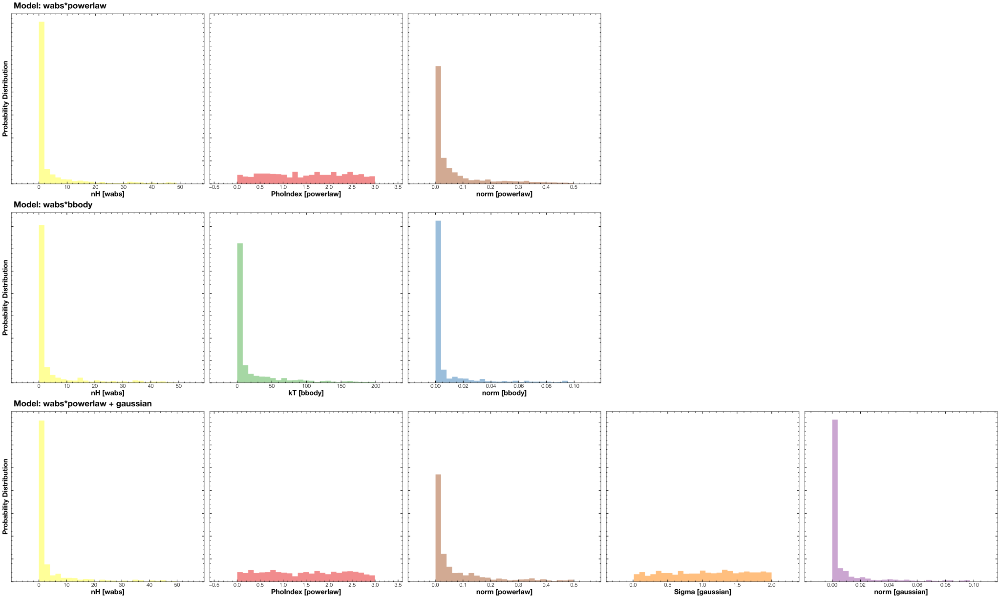

In [22]:
# we can make an overview of the priors
with XSilence():
    pbx.plot_overview_priors([solver1,solver2,solver3],
                             nsample=1000,nbins=25,
                             convert_log=True)

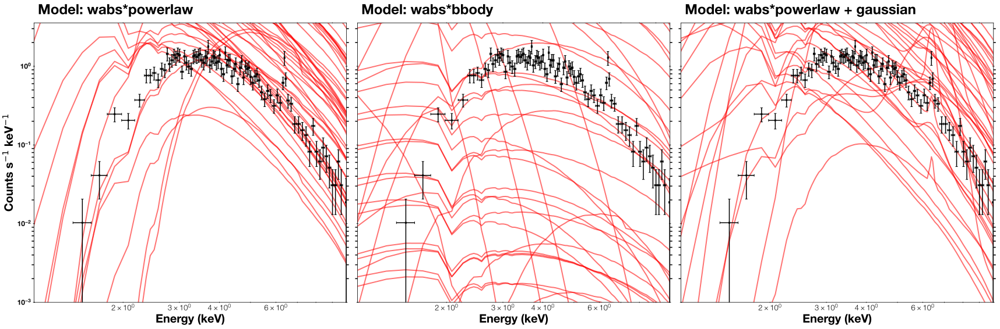

In [23]:
# ... and look at the possible models as predictive checks
with XSilence():
    pbx.plot_model_instances([solver1,solver2,solver3],
                             models=[activate_mod1,activate_mod2,activate_mod3], #<= This will be a regular input for
                             nsample=50,print_values=False,                      #   for the BXA methods. It allows
                             ymin=1e-3,                                          #   us to switch among models.
                             rebinsig=5,rebinbnum=20)

#### run the fits

In [24]:
# Model 1
with XSilence():
    mod1,_ = activate_mod1()            #<= Here we re-activate the XSpec model...
    for t in solver1.transformations:   #<= ... and here we point the solver back to the correct
        t['model'] = mod1               #       instance of the model

    results1 = solver1.run(resume=True)

[ultranest] Resuming from 6733 stored points


[ultranest] Explored until L=-5e+02  


[ultranest] Likelihood function evaluations: 11677


[ultranest] Writing samples and results to disk ...


[ultranest] Writing samples and results to disk ... done


[ultranest]   logZ = -475.9 +- 0.1132


[ultranest] Effective samples strategy satisfied (ESS = 1912.0, need >400)


[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)


[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.11, need <0.5)


[ultranest]   logZ error budget: single: 0.16 bs:0.11 tail:0.02 total:0.11 required:<0.50


[ultranest] done iterating.



logZ = -475.905 +- 0.283
  single instance: logZ = -475.905 +- 0.161
  bootstrapped   : logZ = -475.893 +- 0.283
  tail           : logZ = +- 0.020
insert order U test : converged: True correlation: inf iterations

    log(nH)             : 0.876 │ ▁▁ ▁▁▁▁▁▁▁▁▂▃▃▄▅▅▇▇▇▇▇▆▄▄▃▃▁▂▁▁▁▁▁▁ ▁ │1.064     0.974 +- 0.021
    PhoIndex            : 1.16  │ ▁▁▁▁▁▁▁▁▂▂▂▃▃▅▆▇▇▇▇▇▇▆▅▄▄▃▂▂▂▁▁▁▁▁▁▁▁ │2.13      1.64 +- 0.12
    log(norm)           : -2.549│ ▁▁▁▁▁▁▁▁▂▂▂▃▃▅▅▇▇▇▇▇▆▅▅▄▃▂▂▁▁▁▁▁▁▁▁▁▁ │-1.788    -2.174 +- 0.093



In [25]:
# Model 2
with XSilence():
    mod2,_ = activate_mod2()
    for t in solver2.transformations:
        t['model'] = mod2

    results2 = solver2.run(resume=True)

[ultranest] Resuming from 7405 stored points


[ultranest] Explored until L=-5e+02  


[ultranest] Likelihood function evaluations: 17599


[ultranest] Writing samples and results to disk ...


[ultranest] Writing samples and results to disk ... done


[ultranest]   logZ = -479.3 +- 0.1347


[ultranest] Effective samples strategy satisfied (ESS = 1837.4, need >400)


[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)


[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.14, need <0.5)


[ultranest]   logZ error budget: single: 0.19 bs:0.13 tail:0.02 total:0.14 required:<0.50


[ultranest] done iterating.



logZ = -479.364 +- 0.442
  single instance: logZ = -479.364 +- 0.182
  bootstrapped   : logZ = -479.321 +- 0.442
  tail           : logZ = +- 0.020
insert order U test : converged: True correlation: inf iterations

    log(nH)             : 0.696 │ ▁   ▁▁▁▁▁▁▁▂▃▃▄▅▅▆▇▇▇▇▆▅▅▄▃▂▂▁▁▁▁▁▁▁▁ │0.884     0.796 +- 0.023
    log(kT)             : 0.152 │ ▁▁▁▁▁▁▁▁▂▃▃▄▅▆▆▇▇▇▆▇▅▄▃▂▂▂▁▁▁▁▁▁▁▁  ▁ │0.297     0.217 +- 0.017
    log(norm)           : -3.538│ ▁▁▁▁▁▁▁▁▂▃▃▄▆▆▇▇▇▇▆▅▅▄▃▂▂▁▁▁▁▁▁▁ ▁  ▁ │-3.391    -3.474 +- 0.017



In [26]:
# Model 3
#
# This one might take a while to run: switch it on and take some time for a nice cup of tea. Alternatively, 
# consider the example set out in mpi_bxa_example.py, to speed up BXA by using multiple cores. 
with XSilence():
    mod3,_ = activate_mod3()
    for t in solver3.transformations:
        t['model'] = mod3

    results3 = solver3.run(resume=True)

[ultranest] Resuming from 9846 stored points


[ultranest] Explored until L=-4e+02  


[ultranest] Likelihood function evaluations: 47816


[ultranest] Writing samples and results to disk ...


[ultranest] Writing samples and results to disk ... done


[ultranest]   logZ = -449.4 +- 0.1609


[ultranest] Effective samples strategy satisfied (ESS = 2297.7, need >400)


[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.06 nat, need <0.50 nat)


[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)


[ultranest]   logZ error budget: single: 0.21 bs:0.16 tail:0.01 total:0.16 required:<0.50


[ultranest] done iterating.



logZ = -449.352 +- 0.299
  single instance: logZ = -449.352 +- 0.205
  bootstrapped   : logZ = -449.364 +- 0.299
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    log(nH)             : 0.899 │ ▁▁▁▁▁▁▁▁▁▁▂▃▃▄▅▆▇▆▇▇▇▇▅▄▄▃▂▁▁▁▁▁▁▁  ▁ │1.080     0.989 +- 0.022
    PhoIndex            : 1.30  │ ▁▁▁▁▁▁▁▁▁▁▂▃▃▄▅▆▇▆▇▇▆▆▅▄▄▃▂▂▁▁▁▁▁▁▁▁▁ │2.36      1.83 +- 0.13
    log(norm)           : -2.457│ ▁▁▁▁▁▁▁▁▁▁▂▃▄▄▆▆▆▇▇▇▇▆▆▅▅▄▂▂▂▁▁▁▁▁▁▁▁ │-1.681    -2.056 +- 0.099
    Sigma               : 0.010 │▆▇▆▇▇▇▇▇▆▇▅▅▅▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▁ ▁ │0.143     0.037 +- 0.018
    log(norm)           : -4.308│ ▁▁▁▁▁▁▁▁▁▁▂▂▂▃▄▅▅▆▆▆▇▆▅▅▃▃▂▂▁▁▁▁▁ ▁▁▁ │-3.684    -3.988 +- 0.076



#### Visualise the results

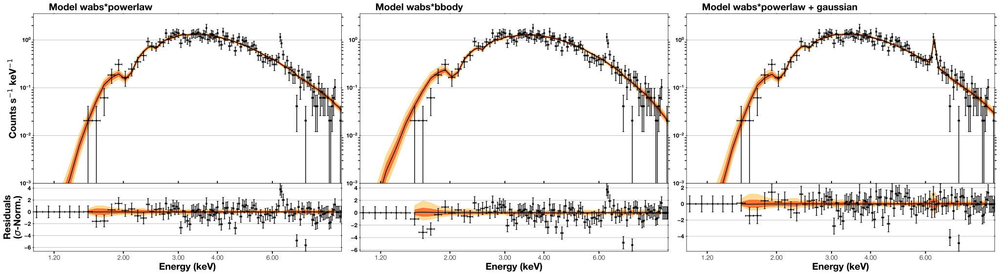

In [27]:
# Overview of the fitted models
with XSilence():
    pbx.plot_data_and_predictionbands([solver1,solver2,solver3],
                                      [activate_mod1,activate_mod2,activate_mod3],
                                      setxminorticks=[1.2,2,3,4,6],
                                      ymin=1e-3,
                                      rebinsig=5,rebinbnum=10)

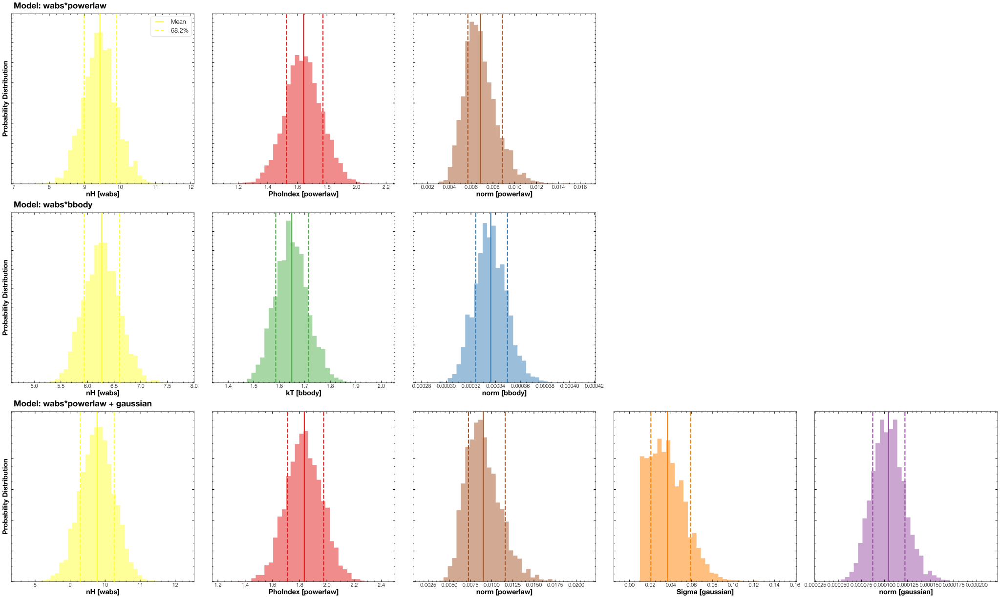

In [28]:
# Overview of parameter posteriors
pbx.plot_overview_posteriors([solver1,solver2,solver3],convert_log=True)

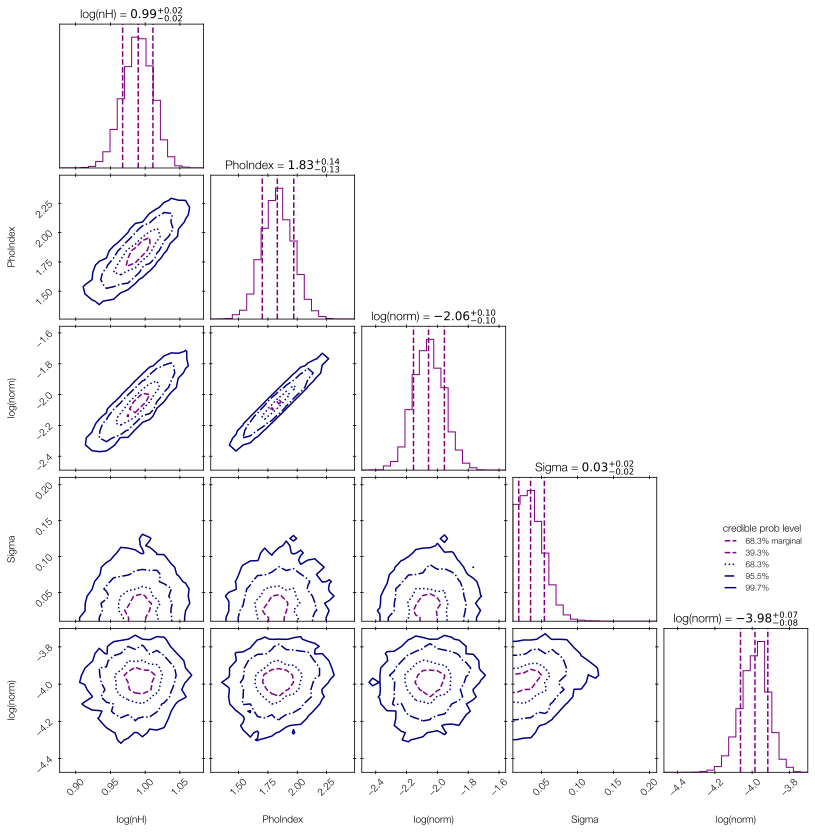

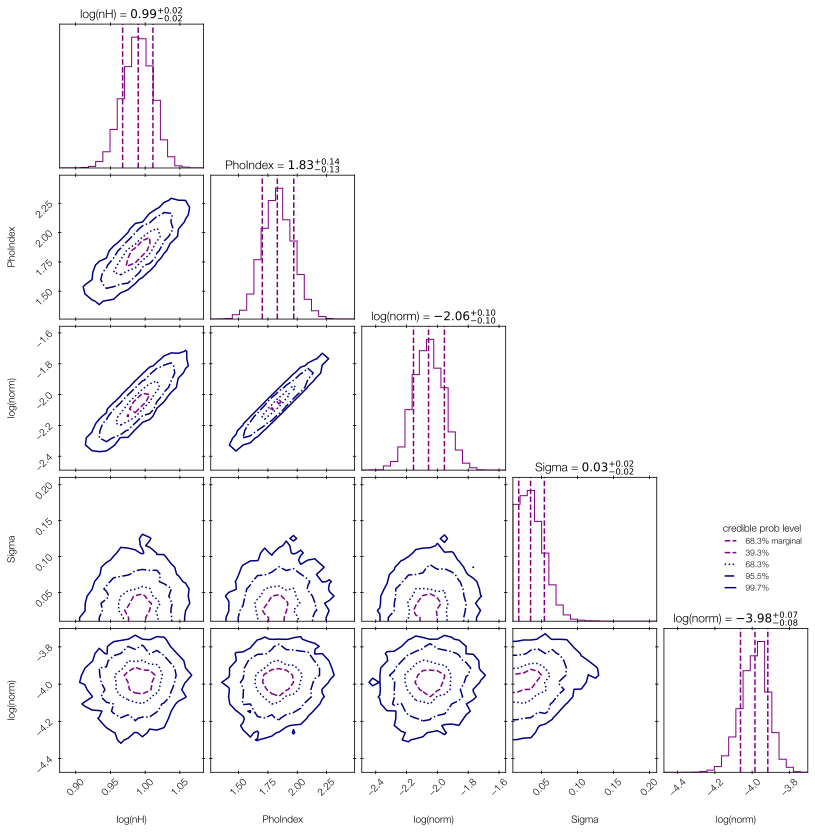

In [29]:
# The corner plots are of course also still available, e.g. for Model 3:
upl.cornerplot(results3)

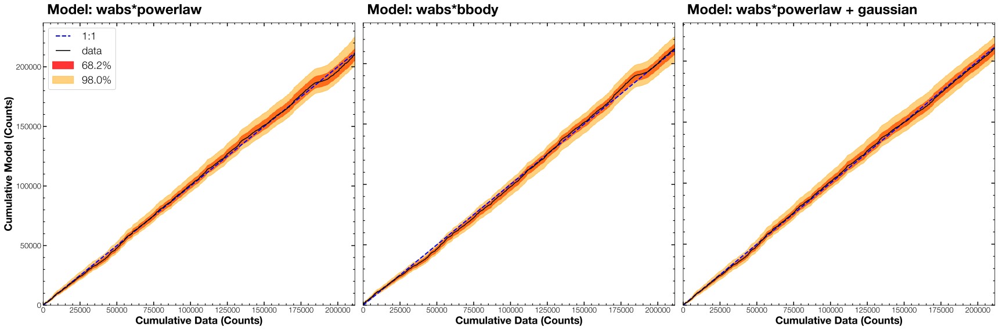

In [30]:
# QQ plots
with XSilence():
    pbx.plot_qq([solver1,solver2,solver3],
                models=[activate_mod1,activate_mod2,activate_mod3],
                quantile=0.49)

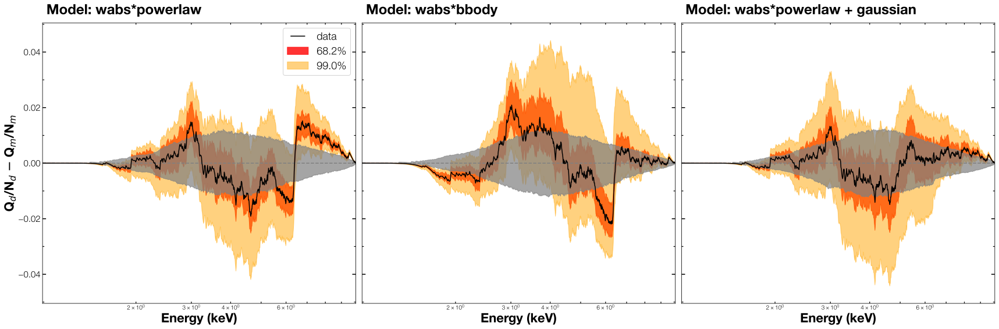

In [31]:
with XSilence():
    pbx.plot_qq_difference([solver1,solver2,solver3],
                           models=[activate_mod1,activate_mod2,activate_mod3],
                           sim_data=True,nsample=500, #<= To speed up the process, it is always possible to reduce
                           quantile=0.495)            #   nsample (i.e. use fewer simulated spectra for the estimate)

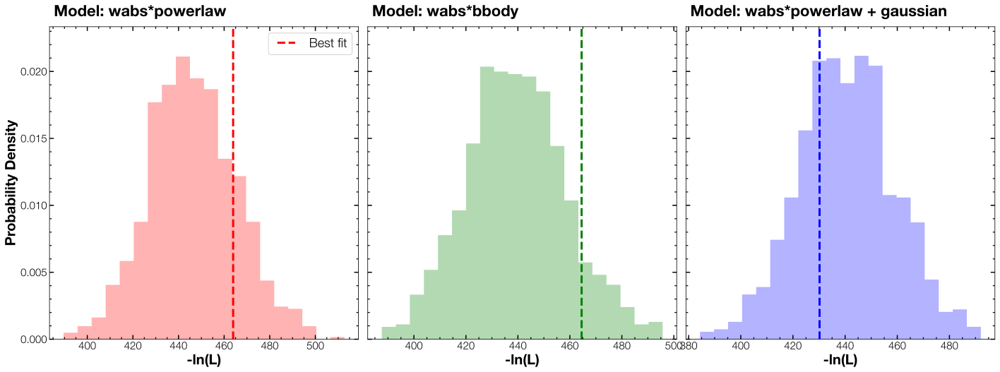

In [32]:
# posterior predictive checks (using MC estimates)
with XSilence():
    pbx.plot_posterior_mc_likelihood([solver1,solver2,solver3],
                                     models=[activate_mod1,activate_mod2,activate_mod3],
                                     nsample=1000,colors=['r','g','b'])

For model wabs*powerlaw:
Mean=5.133 (+)5.264 (-)5.010 (10^-12 erg cm^-2 s^-1)
With uncertainties estimated for +/- 34.1%



For model wabs*bbody:
Mean=5.202 (+)5.334 (-)5.073 (10^-12 erg cm^-2 s^-1)
With uncertainties estimated for +/- 34.1%



For model wabs*powerlaw + gaussian:
Mean=5.048 (+)5.175 (-)4.928 (10^-12 erg cm^-2 s^-1)
With uncertainties estimated for +/- 34.1%



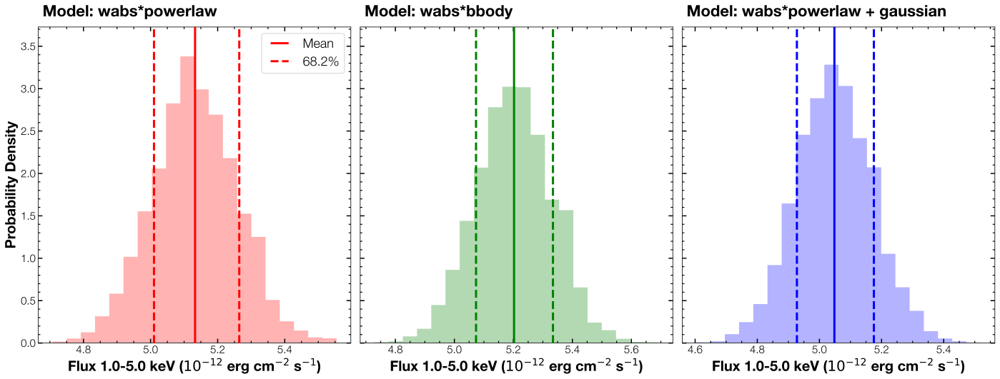

In [33]:
# the fluxes
with XSilence():
    pbx.plot_posterior_flux([solver1,solver2,solver3],
                            models=[activate_mod1,activate_mod2,activate_mod3],
                            fluxrange=(1.0,5.0),
                            colors=['r','g','b'],
                            printq=True)          #<= Print the model fluxes and uncertainties to screen

### Bayesian evidence

Based on the visual inspection of our results, as set out above, it appears that models 1 & 3 both perform better than model 2. With the help of the Bayesian evidence we can put this is a more quanitified way and also investigate the relative strength of models 1 & 3.

In [34]:
# An overview of some statistics for each of the models. The 'Bayes factor' 
# is the ratio of the evidence for the two models. And the log-likelihood 
# and Akaike information criterion (AIC) provide other measures to quantify
# the 'strength' of a given fit
#
# In the results below (where we know the model used to simulate our spectrum)
# we would expect 'mod3' to present the strongest evidence

pbx.print_bayes_statistics([solver1,solver2,solver3])

For mod1/mod2 = (wabs*powerlaw)/(wabs*bbody):
Bayes factor: log(Z_1/Z_2) = -475.90 - -479.36 =  3.46
Likelihood:   log(L_1/L_2) = -463.94 - -464.51 =  0.57
AIC:          AIC_1-AIC_2  =  933.88 -  935.01 = -1.14
###########
For mod1/mod3 = (wabs*powerlaw)/(wabs*powerlaw + gaussian):
Bayes factor: log(Z_1/Z_2) = -475.90 - -449.35 = -26.55
Likelihood:   log(L_1/L_2) = -463.94 - -430.18 = -33.76
AIC:          AIC_1-AIC_2  =  933.88 -  870.36 =  63.52
###########
For mod2/mod3 = (wabs*bbody)/(wabs*powerlaw + gaussian):
Bayes factor: log(Z_1/Z_2) = -479.36 - -449.35 = -30.01
Likelihood:   log(L_1/L_2) = -464.51 - -430.18 = -34.33
AIC:          AIC_1-AIC_2  =  935.01 -  870.36 =  64.65
###########


Based on the Bayesian evidence and other statistics presented above, it appears that model 3 provides a better fit than model 1, but is this significant? Based on an inspections of our plots, we would likely intuitively say 'no'. However, we can quantify this. Following this [useful tutorial example](https://peterboorman.com/tutorial/session3.html#ex32), we check the significance of our calculated Bayes-factor against a simulated dataset. 

For a given pair of models: A & B, say that we want to test whether B is truly better than A. We can test for type 1 & type 2 errors. Testing for type 1 errors (```plot_false_positive_test()```) means we create a sample of fake spectra under the assumption that that model A is correct. We then fit both models to each of the fake spectra and create a range of Bayes factors. We can compare the Bayes factor for the best-fit model to the real data to the distribution of Bayes factors based on the fits to the simulated data. Was the difference between A & B really significant or whas it in fact quite likely to get a slightly smaller factor (i.e. a better fit) for B, even if the data were actually really best described with model A?

Similarly, for a type 2 test (```plot_false_negative_test()```) we generate fake spectra assuming that model B is the 'real' model. How likely is it that we find a better evidence for model A, despite the fact that model B is the right one? Using the distribution of Bayes factors from the simulated data, we can assign a significance to the relative strengths of our best-fit models.

**Please note**: running the two PlotBXA methods mentioned above involves repeated fitting with BXA of two models. The run time for such a task will almost certainly be beyond even several tea breaks. For this reason, it is advised to use the multi-processing example given below and/or to run such evaluations overnight or on a large, multicore system or cluster. For this reason the examples of running these methods in this notebook are included to illustrate how to call the methods, but commented out in the cells below. An example of the resulting plot has been included in the 'examples' directory of the BXA installation (type1_test_plot.png).


In [35]:
## The simple example. This should run without problem and will be the easiest to run 
## for first-time users. However, given the long run-time, the multi-process example
## below is recommended.

#nsample = 24                             #<= this will result in 24^2 Bayes factors for the distribution; as reasonable size
#solvers = [solver1,solver3]              #<= test whether model 3 (more complex) is really better than model 1 (simpler)
                                          #   NOTE: the order is important here: the simulated spectra will now be 
                                          #         based on the model from solver1
#models  = [activate_mod1,activate_mod3]  #<= matches the order of the solvers
#spec_prefix = 'tt1_wabs_pl_g'            #<= label for the simulated spectra (prefix of their file name)
#bq = 0.9                                 #<= quantile for the distribution of the Bayes factor to show in the plot
#with XSilence():
#    bayes_quantile = pbx.plot_false_positive_test(existing_data=False,  #<= there are no fit-results in place
#                                                  datadir='test_type1', #<= the directory where to store the fit results
#                                                  solvers=solvers,
#                                                  models=models,
#                                                  nsample=nsample,
#                                                  spec_prefix=spec_prefix, 
#                                                  gen_new_spec=True,    #<= generate a set of new simulated spectra
#                                                  quantile=bq)

In [36]:
## The simple example for the type-2 test

#nsample = 24                             #<= this will result in 24^2 Bayes factors for the distribution; a reasonable sample
#solvers = [solver1,solver3]              #<= test whether model 3 (more complex) is really better than model 1 (simpler)
                                          #   NOTE: the order is important here: the simulated spectra will now be 
                                          #         based on the model from solver3
#models  = [activate_mod1,activate_mod3]  #<= matches the order of the solvers
#spec_prefix = 'tt2_wabs_pl_g'            #<= label for the simulated spectra (prefix of their file name)
#bq = 0.9                                 #<= quantile for the distribution of the Bayes factor to show in the plot
#with XSilence():
#    bayes_quantile = pbx.plot_false_negative_test(existing_data=False,  #<= there are no fit-results in place
#                                                  datadir='test_type2', #<= the directory where to store the fit results
#                                                  solvers=solvers,
#                                                  models=models,
#                                                  nsample=nsample,
#                                                  spec_prefix=spec_prefix, 
#                                                  gen_new_spec=True,    #<= generate a set of new simulated spectra
#                                                  quantile=bq)

### 2.1) Simple multi-process example for running several BXA fits simultaneaously

##### The quicker option (example here for the type 1 test): 
- a) generate the fake spectra (this can be done inside the notebook)
- b) create the necessary command; the command is then best run in the terminal directly, not in the notebook
    - The command will run an external script: parallel_bxa_tt1.py (this script can be found in the BXA installation directory -> examples/xspec/bayesian_workflow/mp_scripts). Additional information on multiprocessing is provided in this script
- c) inspect the results by simply loading them in, _after_ all the BXA fitting is done. The left plot shows the probability density of the Bayes factor and the right one the cumulative distribution.

In [37]:
# a) Create fake spectra (do not run this more than once)
#
# we make use of one of the private methods of the PlotBXA class. For these there are also docstrings
# available: see help(pbx._create_fake_spectra) for further details on the key-word specifications 
# used below. The command will create 24 spectra based on the model 'mod1' using the best-fit results
# from the solver, and store them in the directory 'fakeit_spectra'. This is the required set-up.

nsample = 24
spec_prefix = 'tt1_wabs_pl_g'
sim_dir = 'fakeit_spectra'
with XSilence():
    _,_ = pbx._create_fake_spectra(solver1,'mod1',
                                   nsample=nsample,
                                   store_spec=True,
                                   spec_prefix=spec_prefix,
                                   savedir=sim_dir)


***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_0_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overwritten.

***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_1_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overwritten.

***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_2_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overwritten.

***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_3_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overwritten.

***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_4_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overwritten.

***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_5_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overwritten.

***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_6_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overw


***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_22_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overwritten.

***XSPEC Error: Invalid chars in file name: fakeit_spectra/tt1_wabs_pl_g_23_fakeit_tmp_0.pha
***Existing file (if any) will NOT be overwritten.


In [38]:
# b) show the command to be copy-pasted into the terminal (run from the examples directory)
#
# The terminal command will use xargs to create a number of different processes. 
# To do so, we need to pass the generated fake spectra as arguments.

# create the output directory for the fitting results
if not os.path.exists('test_type1'):
    os.mkdir('test_type1')

# list all simulated spectra
list_files = f'ls example_data/athena/fakeit_spectra/{spec_prefix}_{{0..{nsample-1}}}*_0.pha'

# sort them lexicographically (this is mainly for well-ordered storage)
# the sort argument below splits the filename at the '_' character and 
# then orders the results numerically based on the 5th element (check the
# output of the list_files command to see why this is necessary)
sort_files = 'sort -t_ -k5,5n'

# set up the multiple processing. The number of processes created is set by max-procs
# (please see the note in parallel_bxa_tt1.py on the number of cores to use)
nproc = 8
run_procs  = f'xargs --max-args=1 --max-procs={nproc} python mp_scripts/parallel_bxa_tt1.py'

# BXA generates a lot of output. Rather than printing it to screen, we will store
# it in a file
output_file  = 'tt1_run.log'

print(f'{list_files} | {sort_files} | {run_procs} > {output_file}')

ls example_data/athena/fakeit_spectra/tt1_wabs_pl_g_{0..23}*_0.pha | sort -t_ -k5,5n | xargs --max-args=1 --max-procs=8 python mp_scripts/parallel_bxa_tt1.py > tt1_run.log


In [39]:
# c) once all the fitting is done, load and plot the results

# The likelihood of our best-fit models should indicate that we prefer 'mod3' over
#  mod1' (after all, it accounts for the Fe Ka feature). We will now see how likely
# it is for 'mod3' to be the preferred model _if 'mod1' represented the real parent
# distribution_. By passing 'mod1' as the first element in the array under the
# keyword argument mnames, we indicate that this is the model 

if len(os.listdir(os.path.join(maindir,'example_data/athena/test_type1')))!=0:
    # if the command created in the cell above has run correctly...
    
    bq = 0.9 #<= quantile for the distribution of the Bayes factor to show in the plot
    with XSilence():
        bayes_quantile = pbx.plot_false_positive_test(existing_data=True,    #<= load existing fit results
                                                      datadir='test_type1',  #<= the directory the fit results are stored
                                                      mnames=['mod1','mod3'],#<= model names used to store the results
                                                      nsample=nsample,
                                                      spec_prefix=spec_prefix,
                                                      gen_new_spec=False,    #<= DO NOT generate new simulated spectra
                                                      quantile=bq,
                                                      savename=os.path.join(maindir,'type1_test_plot.png'))

    print(f'Cutoff level for a false-positive rate <{(1-bq)*100:.0f}% is a Bayes factor of {bayes_quantile[0]:.2f}')

## 3) Fitting multiple spectra

We will follow the outline of the exampe for fitting multiple spectra simultaneously from the notebook _tutorial_usage_plotxspec_, using the same simulated XMM-_Newton_ dataset (pn & MOS). This section serves mainly to illustrate the PlotBXA functionality when fitting multiple spectra simultaneously. The required XSpec setup is explained in the PlotXspec tutorial notebook and the usage of the PlotBXA method is virtually identical to the examples provided in the previous sections. Please note that the fitting of the spectra will likely take significantly longer than for the single-spectrum case.

In [40]:
with XSilence():
    # Load the data
    xspec.AllData.clear()
    xspec.AllModels.clear()

    if 'xmm' not in os.getcwd():
        os.chdir(os.path.join(maindir,'example_data/xmm/'))

    epicfn = 'epic_pn_agn.fak'
    mos1fn = 'epic_mos1_agn.fak'
    mos2fn = 'epic_mos2_agn.fak'

    # load into different data groups
    xspec.AllData(f"1:1 {epicfn} 2:2 {mos1fn} 3:3 {mos2fn}")

    # Spectral range
    xspec.AllData.notice('all')
    xspec.AllData.ignore('bad')
    for ii in range(1,4):
        xspec.AllData(ii).ignore('**-0.2 10.0-**')
        
xspec.AllData.show()


3 files 3 spectra 
Spectrum 1  Spectral Data File: epic_pn_agn.fak
Net count rate (cts/s) for Spectrum:1  6.366e-02 +/- 1.128e-03
 Assigned to Data Group 1 and Plot Group 1
  Noticed Channels:  39-1999
  Telescope: XMM Instrument: EPN  Channel Type: PI
  Exposure Time: 5e+04 sec
 Using fit statistic: cstat
 Using Response (RMF) File            epic_pn.rsp for Source 1

Spectrum 2  Spectral Data File: epic_mos1_agn.fak
Net count rate (cts/s) for Spectrum:2  6.016e-02 +/- 1.097e-03
 Assigned to Data Group 2 and Plot Group 2
  Noticed Channels:  15-666
  Telescope: XMM Instrument: EMOS1  Channel Type: PI
  Exposure Time: 5e+04 sec
 Using fit statistic: cstat
 Using Response (RMF) File            epic_mos1.rsp for Source 1

Spectrum 3  Spectral Data File: epic_mos2_agn.fak
Net count rate (cts/s) for Spectrum:3  5.970e-02 +/- 1.093e-03
 Assigned to Data Group 3 and Plot Group 3
  Noticed Channels:  15-666
  Telescope: XMM Instrument: EMOS2  Channel Type: PI
  Exposure Time: 5e+04 sec
 Usin

In [41]:
# Define models
#
# Instead of a single model instance, the functions now return a list of all three 
# XSpec models (for pn, MOS1, and MOS2, respectively). PlotBXA methods are designed
# to deal with this format as well.

z_opt = 0.015 # <= assume this is known (e.g. from an optical spectrum)

def activate_mod1():
    model_name = 'mod1'
    xspec.AllModels += ("constant*(zTBabs*zpowerlw)",model_name)
    mod = [xspec.AllModels(ii,model_name) for ii in (1,2,3)]

    mod[0].constant.factor.values = (1,-1)  ## constant factor (frozen for pn)
    
    mod[0].zTBabs.Redshift.values = (z_opt, -1)
    mod[0].zTBabs.nH.values = (0.1, 0.01, 1e-3, 1e-3, 50., 50.)

    mod[0].zpowerlw.PhoIndex.values = (1.95, -1) #<= fix this to speed up the fitting process (example only)
    mod[0].zpowerlw.Redshift.values = (z_opt, -1)
    mod[0].zpowerlw.norm.values = (1.e-2, 0.01, 5.e-3, 5.e-3, 0.5, 0.5)

    # unfreeze constant for MOS spectra
    mod[1].constant.factor.untie()
    mod[1].constant.factor.values = (1, 0.01, 0.8, 0.8, 1.0, 1.0)
    mod[2].constant.factor.untie()
    mod[2].constant.factor.values = (1, 0.01, 0.8, 0.8, 1.0, 1.0)
    
    return mod,model_name

def activate_mod2():
    # same as mod1, but with added absorption component
    model_name = 'mod2'
    xspec.AllModels += ("constant*(zTBabs*zpowerlw + zgauss)",model_name)
    mod = [xspec.AllModels(ii,model_name) for ii in (1,2,3)]

    mod[0].constant.factor.values = (1,-1)  ## constant factor (frozen for pn)
    
    mod[0].zTBabs.Redshift.values = (z_opt, -1.)
    mod[0].zTBabs.nH.values = (0.1, 0.01, 1e-1, 1e-1, 50., 50.)

    mod[0].zpowerlw.PhoIndex.values = (1.95, -1) #<= fix this to speed up the fitting process (example only)
    mod[0].zpowerlw.Redshift.values = (z_opt, -1.)
    mod[0].zpowerlw.norm.values = (1.e-2, 0.01, 5.e-3, 5.e-3, 0.5, 0.5)

    mod[0].zgauss.LineE.values = (6.4, -1)  #<= Fix as K-alpha
    mod[0].zgauss.Sigma.values = (0.1, 0.01, 0.01, 0.01, 2., 2.)
    mod[0].zgauss.Redshift.values = (z_opt, -1)
    mod[0].zgauss.norm.values  = (1e-3, 0.01, 5e-4, 5e-4, 5e-3, 5e-3)

    # unfreeze constant for MOS spectra
    mod[1].constant.factor.untie()
    mod[1].constant.factor.values = (1, 0.01, 0.8, 0.8, 1.0, 1.0)
    mod[2].constant.factor.untie()
    mod[2].constant.factor.values = (1, 0.01, 0.8, 0.8, 1.0, 1.0)
    
    return mod, model_name

##### A note on creating the BXA solvers
When creating these for a fit with multiple data groups in XSpec, the order of the priors in the solver is important. In particular, PlotBXA methods require the priors to be presented in the same order as the loaded spectra: first all priors associated with the parameters that are free in data group 1 (i.e. the first spectrum), then all the priors associated with data group 2 (the second spectrum), etc.

In the example below, we pass the priors to the solver using the 'transformations' argument. For 'mod1' the first 2 priors relate to the pn spectrum (data group 1), the 3rd prior is for the constant scaling factor for the MOS1 spectrum (data group 2), and the 4th prior is the scaling factor for the MOS2 spectrum (data group 3). This order must be used for PlotBXA methods to correctly access the model components.

In [42]:
# Create solvers. 
# Note that there is a slight diffence with the case for only a single
# loaded spectrum: we always need to call the model activation function
# first. This is because as soon as a new model is defined, the models
# associated with the spectra in data groups 2 and 3 will disappear (try it)
# This means that we need to recreate them each time the solver will
# need to access them.
#
# Model 1
print('Model 1')
with XSilence():
    mod1,mname = activate_mod1()

m1p1 = bxa.create_loguniform_prior_for(mod1[0],mod1[0].zTBabs.nH)
m1p2 = bxa.create_loguniform_prior_for(mod1[0], mod1[0].zpowerlw.norm)
m1p3 = bxa.create_uniform_prior_for(mod1[1], mod1[1].constant.factor)
m1p4 = bxa.create_uniform_prior_for(mod1[2], mod1[2].constant.factor)

solver1 = bxa.BXASolver(transformations=[m1p1,m1p2,m1p3,m1p4],
                        outputfiles_basename="mod1_mult_ztb-zpl-zg")

# Model 2
print('\nModel 2')
with XSilence():
    mod2,mname = activate_mod2()
    
m2p1 = bxa.create_loguniform_prior_for(mod2[0], mod2[0].zTBabs.nH)
m2p2 = bxa.create_loguniform_prior_for(mod2[0], mod2[0].zpowerlw.norm)
m2p3 = bxa.create_loguniform_prior_for(mod2[0], mod2[0].zgauss.Sigma)
m2p4 = bxa.create_loguniform_prior_for(mod2[0], mod2[0].zgauss.norm)
m2p5 = bxa.create_uniform_prior_for(mod2[1], mod2[1].constant.factor)
m2p6 = bxa.create_uniform_prior_for(mod2[2], mod2[2].constant.factor)

solver2 = bxa.BXASolver(transformations=[m2p1,m2p2,m2p3,m2p4,m2p5,m2p6],
                        outputfiles_basename="mod2_mult_ztb-zpl-zg")

Model 1


  jeffreys prior for nH between 1.000000e-03 and 5.000000e+01 
  jeffreys prior for norm between 5.000000e-03 and 5.000000e-01 
  uniform prior for factor between 0.800000 and 1.000000 
  uniform prior for factor between 0.800000 and 1.000000 

Model 2


  jeffreys prior for nH between 1.000000e-01 and 5.000000e+01 
  jeffreys prior for norm between 5.000000e-03 and 5.000000e-01 
  jeffreys prior for Sigma between 1.000000e-02 and 2.000000e+00 
  jeffreys prior for norm between 5.000000e-04 and 5.000000e-03 
  uniform prior for factor between 0.800000 and 1.000000 
  uniform prior for factor between 0.800000 and 1.000000 


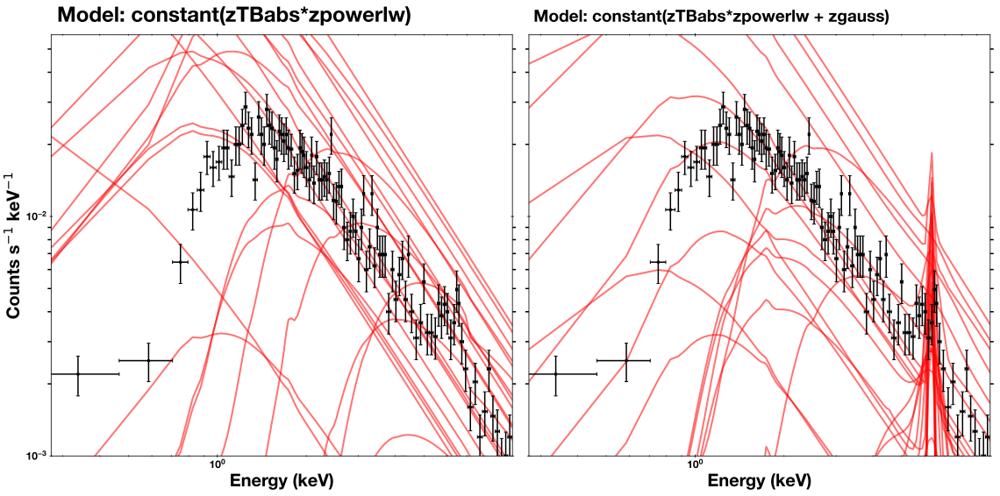

In [43]:
# predictive checks for e.g. the MOS1 spectrum
with XSilence():
    pbx.plot_model_instances([solver1,solver2],
                             models=[activate_mod1,activate_mod2],
                             idsp=2,                               #<= choose the spectrum
                             nsample=25,print_values=False,
                             ymin=1e-3,
                             rebinsig=5,rebinbnum=20)     

#### Run the fits

In [44]:
# As always, we need to point the solver to the active XSpec model. In this case,
# we need to be a bit more specific than before: the priors (the solver's 
# 'transformations') need to be pointed to the model they belong to, i.e. the model
# associated with the correct data group (spectrum) in XSpec

# Model 1
with XSilence():
    mod1,_ = activate_mod1()
    for t in solver1.transformations[:2]:         #<= the priors associated with data group 1 (pn)
        t['model'] = mod1[0]
    solver1.transformations[2]['model'] = mod1[1] #<= the prior for data group 2 (MOS1)
    solver1.transformations[3]['model'] = mod1[2] #<= the prior for data group 3 (MOS2)

    results1 = solver1.run(resume=True)

[ultranest] Resuming from 7495 stored points


[ultranest] Explored until L=-2e+03  


[ultranest] Likelihood function evaluations: 15418


[ultranest] Writing samples and results to disk ...


[ultranest] Writing samples and results to disk ... done


[ultranest]   logZ = -1799 +- 0.1195


[ultranest] Effective samples strategy satisfied (ESS = 2009.6, need >400)


[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)


[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.12, need <0.5)


[ultranest]   logZ error budget: single: 0.17 bs:0.12 tail:0.01 total:0.12 required:<0.50


[ultranest] done iterating.



logZ = -1799.055 +- 0.308
  single instance: logZ = -1799.055 +- 0.168
  bootstrapped   : logZ = -1799.027 +- 0.308
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    log(nH)             : -0.0230│ ▁▁▁▁▁▁▁▁▁▁▂▂▃▄▄▅▆▆▇▇▇▆▆▅▄▃▃▂▂▁▁▁▁▁▁▁▁ │0.0346    0.0073 +- 0.0072
    log(norm)           : -1.0303│ ▁▁▁▁▁▁▁▂▂▃▃▄▅▅▆▇▇▇▇▅▅▄▃▃▂▁▁▁▁▁▁▁▁   ▁ │-0.9638    -1.0005 +- 0.0079
    factor              : 0.845 │ ▁ ▁ ▁▁▁▁▁▁▁▁▁▁▂▂▃▄▄▅▅▆▇▇▇▇▇▇▆▅▆▄▄▃▃▂▂▂│1.000     0.948 +- 0.023
    factor              : 0.838 │ ▁   ▁ ▁▁▁▁▁▁▁▁▂▂▃▄▅▆▆▆▇▇▇▇▇▆▅▅▄▄▃▂▂▁▁▁│1.000     0.941 +- 0.023



In [45]:
# Model 2  ... another opportunity for a cup of tea (alternatively: this can of course be run on multiple cores,
# following the example set out in mpi_bxa_example.py)
with XSilence():
    mod2,_ = activate_mod2()
    for t in solver2.transformations[:4]:         #<= the priors associated with data group 1 (pn)
        t['model'] = mod2[0]
    solver2.transformations[4]['model'] = mod2[1] #<= the prior for data group 2 (MOS1)
    solver2.transformations[5]['model'] = mod2[2] #<= the prior for data group 3 (MOS2)

    results2 = solver2.run(resume=True)

[ultranest] Resuming from 9099 stored points


[ultranest] Explored until L=-2e+03  


[ultranest] Likelihood function evaluations: 26548


[ultranest] Writing samples and results to disk ...


[ultranest] Writing samples and results to disk ... done


[ultranest]   logZ = -1752 +- 0.1474


[ultranest] Effective samples strategy satisfied (ESS = 2525.9, need >400)


[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)


[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)


[ultranest]   logZ error budget: single: 0.19 bs:0.15 tail:0.01 total:0.15 required:<0.50


[ultranest] done iterating.



logZ = -1752.094 +- 0.278
  single instance: logZ = -1752.094 +- 0.190
  bootstrapped   : logZ = -1752.109 +- 0.278
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    log(nH)             : -0.0411│ ▁  ▁▁▁▁▁▁▁▂▂▃▄▄▆▆▇▇▇▆▅▄▄▃▃▂▂▁▁▁▁▁▁▁ ▁ │0.0238    -0.0085 +- 0.0077
    log(norm)           : -1.0516│ ▁▁▁▁▁▁▁▂▂▃▄▅▅▇▆▇▇▇▆▆▅▅▃▃▂▂▁▁▁▁▁▁▁▁ ▁▁ │-0.9841    -1.0215 +- 0.0085
    log(Sigma)          : -0.556│ ▁▁▁▁▁▁▁▁▂▂▃▄▅▆▆▇▇▇▇▇▅▄▄▃▃▂▂▁▁▁▁▁▁▁▁ ▁ │-0.060    -0.325 +- 0.060
    log(norm)           : -2.953│ ▁▁▁▁▁▁▁▁▁▁▁▁▂▂▃▃▅▅▆▇▇▇▇▇▆▅▅▅▃▂▂▁▁▁▁▁▁ │-2.502    -2.693 +- 0.057
    factor              : 0.857 │ ▁ ▁▁▁▁▁▁▁▁▁▁▂▂▂▃▄▅▅▅▆▆▇▇▇▆▇▆▅▅▅▅▃▃▃▂▂▁│1.000     0.948 +- 0.023
    factor              : 0.841 │ ▁ ▁ ▁▁▁▁▁▁▁▁▁▂▂▃▃▄▄▅▅▇▇▇▇▆▆▆▅▄▃▃▂▂▂▁▁▁│1.000     0.942 +- 0.023



#### Evaluate the posteriors

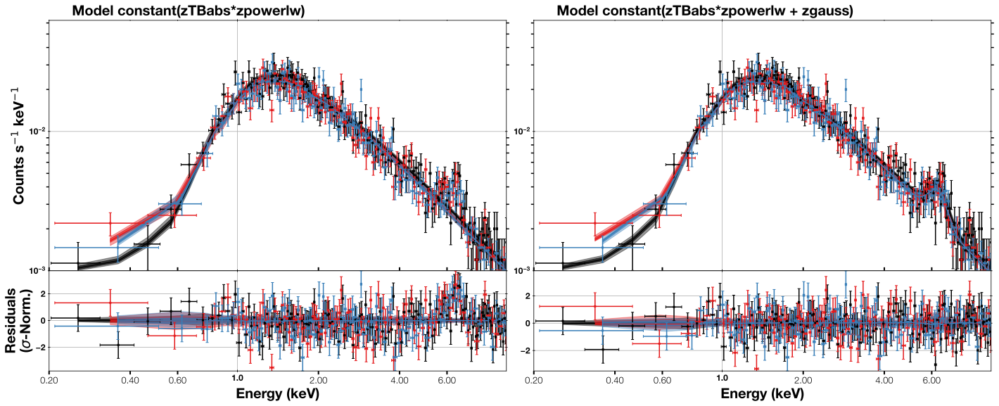

In [46]:
# Overview of the fitted models
with XSilence():
    pbx.plot_data_and_predictionbands([solver1,solver2],
                                      [activate_mod1,activate_mod2],
                                      npost=50, #<= use only subset of the data to display the bands (for speed)
                                      setxminorticks=[0.2,0.4,0.6,2,4,6],
                                      ymin=1e-3,
                                      rebinsig=5,rebinbnum=20)

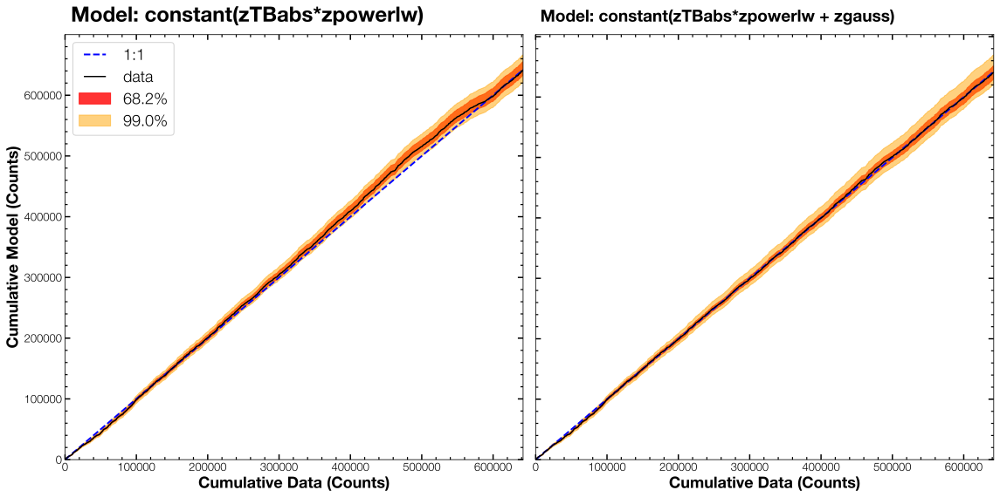

In [47]:
# QQ plot for pn
with XSilence():
    pbx.plot_qq([solver1,solver2],
                models=[activate_mod1,activate_mod2],
                quantile=0.495)

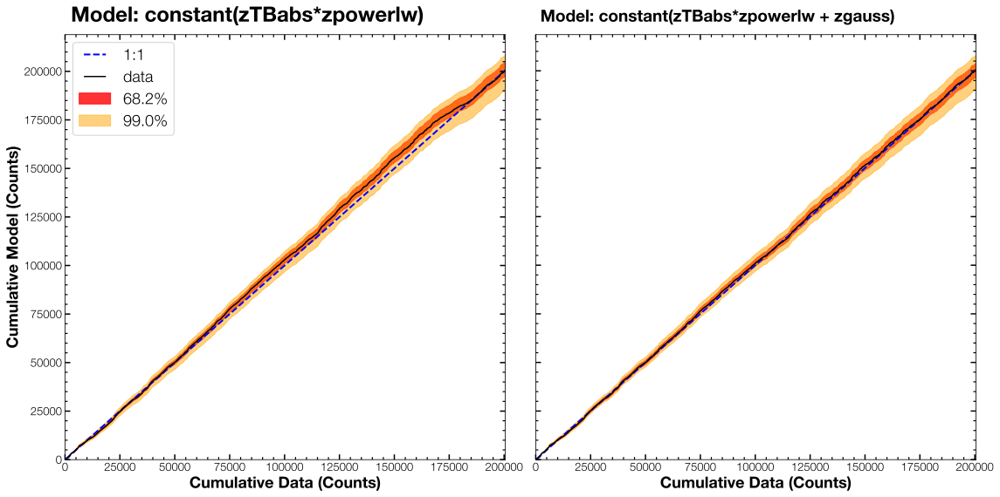

In [48]:
# QQ plot for MOS1
with XSilence():
    pbx.plot_qq([solver1,solver2],
                models=[activate_mod1,activate_mod2],
                idsp=2,
                quantile=0.495)

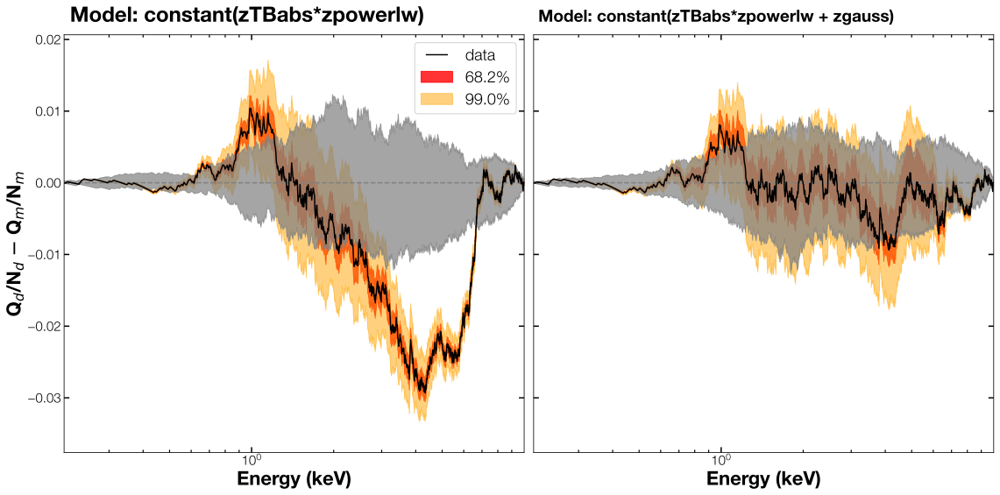

In [49]:
# And similarly for the QQ-difference plots: for pn
with XSilence():
    pbx.plot_qq_difference([solver1,solver2],
                           models=[activate_mod1,activate_mod2],
                           sim_data=True,nsample=50,
                           quantile=0.495)

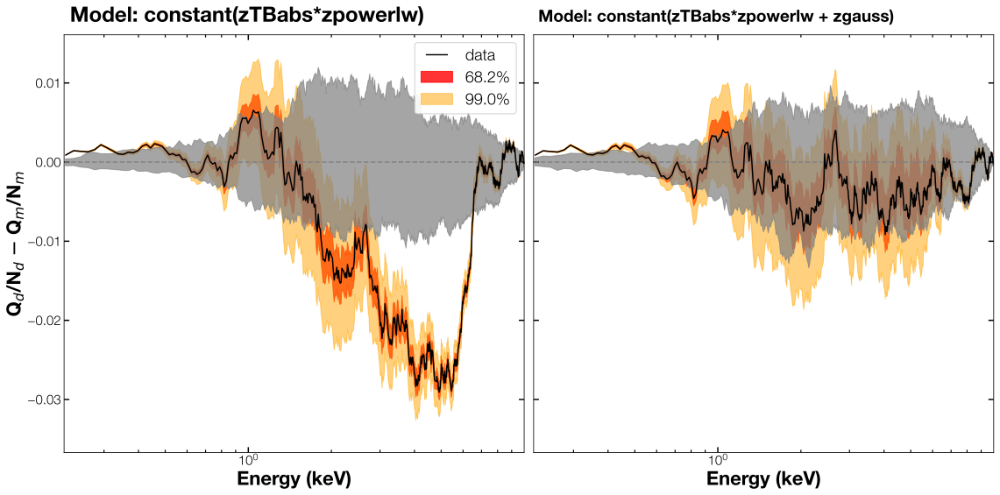

In [50]:
# ... and for MOS1
with XSilence():
    pbx.plot_qq_difference([solver1,solver2],
                           models=[activate_mod1,activate_mod2],
                           idsp=2,
                           sim_data=True,nsample=50,
                           quantile=0.495)

## 4) Additional plotting examples

In [51]:
# We can explore a particular parameter space using the priors. For example, we consider
# the effect of increasing the effect of Galactic absorption: is it possible to capture
# some observed curvature in the spectrum (using the same example data as above) with 
# only Galactic absorption, or do we need an extra model component?

# -1- Define a test model
with XSilence():
    xspec.AllModels.clear()

    model_name = 'mod_display'
    xspec.AllModels += ("TBabs*powerlaw",model_name)
    mod_display = xspec.AllModels(1,model_name)

    mod_display.TBabs.nH.values = (0.5, 0.01, 1e-1, 1e-1, 2.0, 2.0) #<= let the absorbing column density vary

    mod_display.powerlaw.PhoIndex.values = (1.95, -1.)              #<= freeze everything else
    mod_display.powerlaw.norm.values = (0.1, -1.)

# -2- Create a prior for the only free variable
mdisp_prior = bxa.create_loguniform_prior_for(mod_display, mod_display.TBabs.nH)

# -3- ... and pass that prior to the solver
sdisp = bxa.BXASolver(transformations=[mdisp_prior],
                      outputfiles_basename="mod_disp")

  jeffreys prior for nH between 1.000000e-01 and 2.000000e+00 


Model: TBabs*powerlaw
param     min       max       
log(nH)   -0.9481   0.3006    


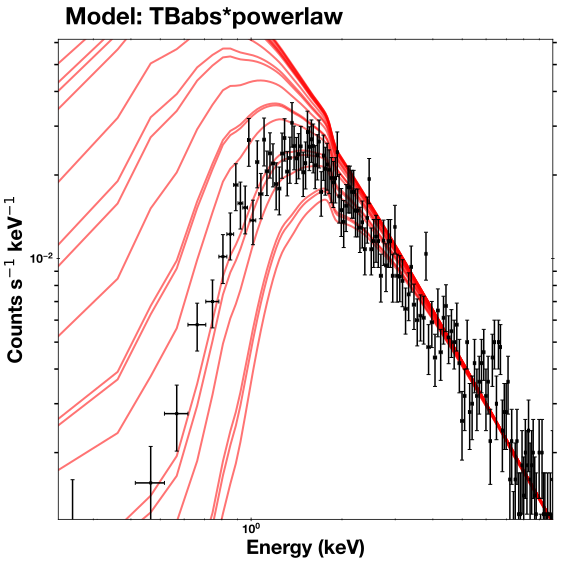

In [52]:
# and let's look at a possible range for N_H, using the plot_model_instances method and using
# the pn data for comparison
with XSilence():
    pbx.plot_model_instances(sdisp,nsample=20,print_values=True,
                             rebinsig=5,rebinbnum=20)